In [1]:
import pandas as pd
import pandas_profiling as pp
import seaborn as sns
import numpy as np
import matplotlib.pylab as plt
import sklearn

In [2]:
# load data
customer_data = pd.read_csv('CustomerData.csv')
customer_data.head()

,CustomerID,City,NoOfChildren,MinAgeOfChild,MaxAgeOfChild,Tenure,FrequencyOfPurchase,NoOfUnitsPurchased,FrequencyOfPlay,NoOfGamesPlayed,NoOfGamesBought,FavoriteChannelOfTransaction,FavoriteGame,TotalRevenueGenerated
0,1001,1,2,3,8.0,210,11,11.0,2344,108,10,Uniform,Uniform,107.51
1,1002,1,2,3,6.0,442,20,20.0,245,22,7,Favorite,Uniform,382.40
2,1003,1,4,3,5.0,424,18,18.0,1059,130,18,Favorite,Uniform,135.01
3,1004,1,1,6,6.0,261,11,9.0,365,34,11,Favorite,Uniform,125.00
4,1005,1,3,6,9.0,422,44,31.0,1066,102,44,Uniform,Uniform,335.05


In [3]:
pp.ProfileReport(customer_data)

In [4]:
# NoOfGamesBought and NoOfUnitsPurchased are highly correlated with FrequencyOfPurchase
# customer ID is distinct and can be dropped
customer_data1 = customer_data.drop(['CustomerID','NoOfGamesBought','NoOfUnitsPurchased'], axis=1)
customer_data1.head()

,City,NoOfChildren,MinAgeOfChild,MaxAgeOfChild,Tenure,FrequencyOfPurchase,FrequencyOfPlay,NoOfGamesPlayed,FavoriteChannelOfTransaction,FavoriteGame,TotalRevenueGenerated
0,1,2,3,8.0,210,11,2344,108,Uniform,Uniform,107.51
1,1,2,3,6.0,442,20,245,22,Favorite,Uniform,382.40
2,1,4,3,5.0,424,18,1059,130,Favorite,Uniform,135.01
3,1,1,6,6.0,261,11,365,34,Favorite,Uniform,125.00
4,1,3,6,9.0,422,44,1066,102,Uniform,Uniform,335.05


In [5]:
# checking correlation plot

corr = customer_data1.corr()
corr.style.background_gradient(cmap='summer_r').set_precision(2)

,City,NoOfChildren,MinAgeOfChild,MaxAgeOfChild,Tenure,FrequencyOfPurchase,FrequencyOfPlay,NoOfGamesPlayed,TotalRevenueGenerated
City,1.00,-0.07,0.01,-0.03,0.05,-0.10,0.05,0.02,-0.07
NoOfChildren,-0.07,1.00,-0.18,0.19,0.09,0.14,0.17,0.21,0.11
MinAgeOfChild,0.01,-0.18,1.00,0.37,-0.06,-0.02,0.01,0.00,0.02
MaxAgeOfChild,-0.03,0.19,0.37,1.00,-0.04,-0.01,0.01,0.03,0.01
Tenure,0.05,0.09,-0.06,-0.04,1.00,0.19,0.24,0.27,0.12
FrequencyOfPurchase,-0.10,0.14,-0.02,-0.01,0.19,1.00,0.28,0.40,0.66
FrequencyOfPlay,0.05,0.17,0.01,0.01,0.24,0.28,1.00,0.74,0.23
NoOfGamesPlayed,0.02,0.21,0.00,0.03,0.27,0.40,0.74,1.00,0.29
TotalRevenueGenerated,-0.07,0.11,0.02,0.01,0.12,0.66,0.23,0.29,1.00


In [6]:
# check missing values
missing = customer_data1.isnull().sum(axis=0).reset_index()
missing.columns = ['column_name', 'missing_count']
missing['missing_ratio'] = (missing['missing_count'] / customer_data1.shape[0])*100
missing.sort_values(by= 'missing_ratio', ascending=False)

,column_name,missing_count,missing_ratio
3,MaxAgeOfChild,2,0.062325
0,City,0,0.000000
1,NoOfChildren,0,0.000000
2,MinAgeOfChild,0,0.000000
4,Tenure,0,0.000000
5,FrequencyOfPurchase,0,0.000000
6,FrequencyOfPlay,0,0.000000
7,NoOfGamesPlayed,0,0.000000
8,FavoriteChannelOfTransaction,0,0.000000
9,FavoriteGame,0,0.000000


In [7]:
# drop na values
customer_data1.dropna(subset=['MaxAgeOfChild'], inplace=True)

In [8]:
# check missing values
missing = customer_data1.isnull().sum(axis=0).reset_index()
missing.columns = ['column_name', 'missing_count']
missing['missing_ratio'] = (missing['missing_count'] / customer_data1.shape[0])*100
missing.sort_values(by= 'missing_ratio', ascending=False)

,column_name,missing_count,missing_ratio
0,City,0,0.0
1,NoOfChildren,0,0.0
2,MinAgeOfChild,0,0.0
3,MaxAgeOfChild,0,0.0
4,Tenure,0,0.0
5,FrequencyOfPurchase,0,0.0
6,FrequencyOfPlay,0,0.0
7,NoOfGamesPlayed,0,0.0
8,FavoriteChannelOfTransaction,0,0.0
9,FavoriteGame,0,0.0


In [9]:
# check data types
customer_data1.dtypes

City                              int64
NoOfChildren                      int64
MinAgeOfChild                     int64
MaxAgeOfChild                   float64
Tenure                            int64
FrequencyOfPurchase               int64
FrequencyOfPlay                   int64
NoOfGamesPlayed                   int64
FavoriteChannelOfTransaction     object
FavoriteGame                     object
TotalRevenueGenerated           float64
dtype: object

In [10]:
# convert columns to category 
category_col = ['FavoriteChannelOfTransaction', 'FavoriteGame']
for c in category_col:
    customer_data1[c] = customer_data1[c].astype('category')
# convert age to int
customer_data1['MaxAgeOfChild'] = customer_data1['MaxAgeOfChild'].astype('int64')
customer_data1.dtypes

City                               int64
NoOfChildren                       int64
MinAgeOfChild                      int64
MaxAgeOfChild                      int64
Tenure                             int64
FrequencyOfPurchase                int64
FrequencyOfPlay                    int64
NoOfGamesPlayed                    int64
FavoriteChannelOfTransaction    category
FavoriteGame                    category
TotalRevenueGenerated            float64
dtype: object

skewness: 2.951273
kurtosis: 13.637220


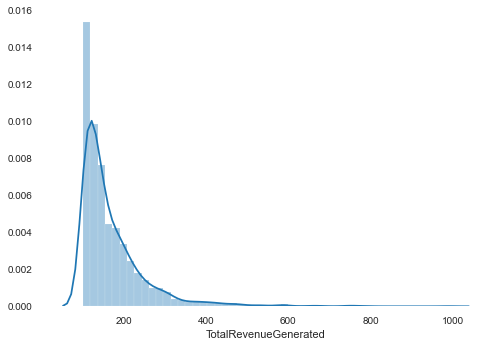

In [11]:
# check For Skewness in the target variable
sns.distplot(customer_data1['TotalRevenueGenerated'])
print('skewness: %f' % customer_data1.TotalRevenueGenerated.skew())
print('kurtosis: %f' % customer_data1.TotalRevenueGenerated.kurt())

In [12]:
# since the skewness is too high, let us use Log Transformation to reduce skewness of target variable
customer_data1['log_revenue'] = np.log(customer_data1['TotalRevenueGenerated'])
customer_data1.drop('TotalRevenueGenerated', axis=1, inplace=True)

skewness: 1.183305
kurtosis: 1.439862


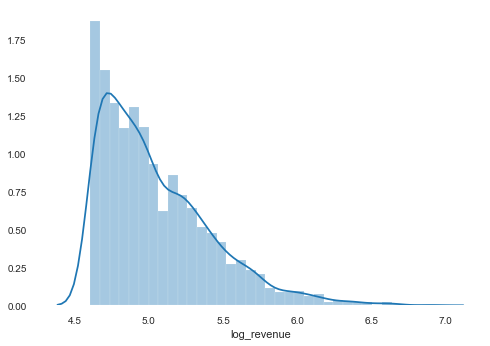

In [13]:
sns.distplot(customer_data1['log_revenue'])
print('skewness: %f' % customer_data1.log_revenue.skew())
print('kurtosis: %f' % customer_data1.log_revenue.kurt())

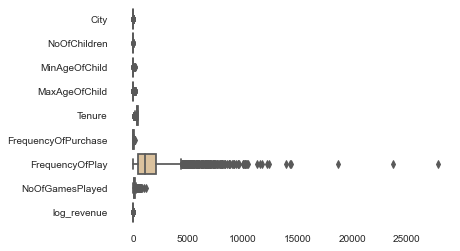

In [14]:
%matplotlib notebook
%matplotlib inline
fig, axs = plt.subplots()
sns.boxplot(data=customer_data1, orient='h', palette='Set2')
plt.show()

In [15]:
# Removing the samples above INTER QUARTILE RANGE
q75, q25 = np.percentile(customer_data1['NoOfGamesPlayed'], [75, 25])
iqr = q75 - q25
print('IQR', iqr)
whisker = q75 + (1.5*iqr)
print('Upper whisker', whisker)

IQR 82.0
Upper whisker 242.0


In [16]:
customer_data1 = pd.DataFrame(customer_data1)
customer_data1['NoOfGamesPlayed'] = customer_data1['NoOfGamesPlayed'].clip(upper=whisker)

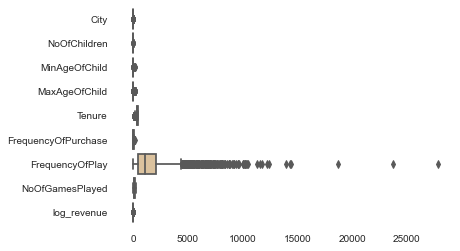

In [17]:
# Checking again for outliers if any
fig, axs = plt.subplots()
sns.boxplot(data=customer_data1,orient='h',palette="Set2")
plt.show()

In [18]:
q75, q25 = np.percentile(customer_data1["FrequencyOfPlay"], [75 ,25])
iqr = q75-q25
print("IQR",iqr)
whisker = q75 + (1.5*iqr)
print("Upper whisker",whisker)

IQR 1585.5
Upper whisker 4409.75


In [19]:
# Removing outlier above the upper whisker
data1=pd.DataFrame(customer_data1)
data1["FrequencyOfPlay"] = data1["FrequencyOfPlay"].clip(upper=whisker)

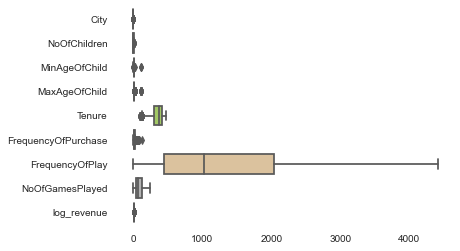

In [20]:
fig, axs = plt.subplots()
sns.boxplot(data=customer_data1,orient='h',palette="Set2")
plt.show()

In [21]:
customer_data1.dtypes

City                               int64
NoOfChildren                       int64
MinAgeOfChild                      int64
MaxAgeOfChild                      int64
Tenure                             int64
FrequencyOfPurchase                int64
FrequencyOfPlay                  float64
NoOfGamesPlayed                    int64
FavoriteChannelOfTransaction    category
FavoriteGame                    category
log_revenue                      float64
dtype: object

In [22]:
# creating dummies for categorical variables
customer_data2 = pd.get_dummies(customer_data1, columns = ['FavoriteChannelOfTransaction', 'FavoriteGame'], drop_first=True)
customer_data2.head()

,City,NoOfChildren,MinAgeOfChild,MaxAgeOfChild,Tenure,FrequencyOfPurchase,FrequencyOfPlay,NoOfGamesPlayed,log_revenue,FavoriteChannelOfTransaction_Uniform,FavoriteGame_Uniform
0,1,2,3,8,210,11,2344.0,108,4.677584,1,1
1,1,2,3,6,442,20,245.0,22,5.946467,0,1
2,1,4,3,5,424,18,1059.0,130,4.905349,0,1
3,1,1,6,6,261,11,365.0,34,4.828314,0,1
4,1,3,6,9,422,44,1066.0,102,5.814280,1,1


In [23]:
# Copying the target varible to y and independent varible to x
X = customer_data2.copy().drop('log_revenue', axis=1)
y = customer_data2['log_revenue']

In [24]:
# splitting data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.30)

In [25]:
x_train.iloc[:,:8].head()

,City,NoOfChildren,MinAgeOfChild,MaxAgeOfChild,Tenure,FrequencyOfPurchase,FrequencyOfPlay,NoOfGamesPlayed
2912,1,2,4,5,409,13,1104.0,100
2523,1,1,7,7,172,11,1378.0,52
2332,1,2,2,4,345,14,1017.0,142
3039,2,5,3,10,452,18,2372.0,147
2304,1,1,6,6,151,7,119.0,5


In [26]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(x_train.iloc[:,:8])

x_train.iloc[:,:8] = scaler.transform(x_train.iloc[:,:8])
x_test.iloc[:,:8] = scaler.transform(x_test.iloc[:,:8])

In [27]:
x_train.head()

,City,NoOfChildren,MinAgeOfChild,MaxAgeOfChild,Tenure,FrequencyOfPurchase,FrequencyOfPlay,NoOfGamesPlayed,FavoriteChannelOfTransaction_Uniform,FavoriteGame_Uniform
2912,-0.360429,-0.142794,-0.224149,-0.328052,0.680854,-0.402529,-0.260748,0.192133,1,1
2523,-0.360429,-1.085232,0.474772,-0.119689,-1.962289,-0.634644,-0.041859,-0.538082,0,1
2332,-0.360429,-0.142794,-0.690095,-0.432234,-0.032906,-0.286472,-0.330249,0.831071,0,1
3039,2.774468,2.684522,-0.457122,0.192857,1.160412,0.177758,0.752212,0.907135,0,1
2304,-0.360429,-1.085232,0.241798,-0.223871,-2.196492,-1.098874,-1.047629,-1.253084,0,1


In [28]:
x_test.head()

,City,NoOfChildren,MinAgeOfChild,MaxAgeOfChild,Tenure,FrequencyOfPurchase,FrequencyOfPlay,NoOfGamesPlayed,FavoriteChannelOfTransaction_Uniform,FavoriteGame_Uniform
2191,-0.360429,-0.142794,-0.224149,-0.223871,-0.389786,-0.750701,-0.847114,-1.177020,1,1
579,-0.360429,-0.142794,0.241798,-0.015507,0.323974,2.614964,-0.870281,-0.903190,1,1
1452,-0.360429,-1.085232,0.008825,-0.328052,0.145534,-0.750701,-0.409337,-0.811913,0,1
2927,-0.360429,-1.085232,0.474772,-0.119689,-0.557074,-0.982816,-0.978128,-1.177020,0,1
55,2.774468,-0.142794,-0.224149,-0.119689,0.223602,-0.402529,-0.824746,-0.872764,0,1


In [29]:
# Modelling
from sklearn import linear_model
linear = linear_model.LinearRegression()
linear.fit(x_train, y_train)

preds_test = linear.predict(x_test)
preds_test1 = np.exp(preds_test)

In [30]:
from sklearn.metrics import mean_squared_error

In [31]:
lr_mse = mean_squared_error(preds_test, y_test)
lr_rmse = np.sqrt(lr_mse)
print("Linear Regression MSE on val: %.4f" %lr_mse)
print('Linear Regression RMSE on val: %.4f' % lr_rmse)

Linear Regression MSE on val: 0.0813
Linear Regression RMSE on val: 0.2852


In [32]:
def mape(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [33]:
print('mape:',mape(y_test, preds_test))

mape: 4.333230098377471
